<a href="https://colab.research.google.com/github/ejnaik/Academic_Assignments_And_Projects/blob/main/Copy_of_MMDS_Assignment_II_24210034.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Question 1

## Pre-requisites

- An Signed Distance Function (SDF) is a mathematical function that gives the shortest distance from any point in space to the surface of a shape, with a sign indicating whether the point is inside or outside the shape.

- A Signed Distance Function (SDF) represents a surface implicitly and provides numerous benefits. It’s particularly useful for boolean operations, collision detection, ray marching, modeling, and physics simulations.


In [1]:
## Run this shell for setting up env
!pip install trimesh pyglet networkx shapely rtree
import numpy as np
import trimesh
import plotly.graph_objects as go
from skimage import measure


# Utility funcs for visualization
def get_pcl_trace(surface_points,size,color,opacity=1):
    points_trace = go.Scatter3d(
        x=surface_points[:, 0],
        y=surface_points[:, 1],
        z=surface_points[:, 2],
        mode='markers',
        marker=dict(
            size=size,
            color=color,
            opacity=0.8
        )
    )
    return points_trace

def get_mesh_trace(mesh,color,opacity=1):
    vertices = mesh.vertices
    faces = mesh.faces

    mesh_trace = go.Mesh3d(
        x=vertices[:, 0],
        y=vertices[:, 1],
        z=vertices[:, 2],
        i=faces[:, 0],
        j=faces[:, 1],
        k=faces[:, 2],
        color=color,
        opacity=opacity,
    )
    return mesh_trace

def get_cone_trace(surface_points,surface_normals,size=1):
    sn = surface_normals / np.linalg.norm(surface_normals, axis=1, keepdims=True)
    cone_trace = go.Cone(
        x=surface_points[:, 0],
        y=surface_points[:, 1],
        z=surface_points[:, 2],
        u=sn[:, 0],
        v=sn[:, 1],
        w=sn[:, 2],
        sizemode="absolute",
        sizeref=size,
        anchor='tail',
        colorscale=[[0, 'blue'], [1, 'blue']],
        showscale=False,
    )
    return cone_trace

def view_trace(data):
    fig = go.Figure(data=data)
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        margin=dict(r=0, l=0, b=0, t=0)
    )

    fig.show()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 708.6/708.6 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.1/962.1 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 541.1/541.1 kB 18.1 MB/s eta 0:00:00


## Q 1.a

Define the implicit Signed Distance Function (SDF) for a sphere centered at the origin with a radius of 0.5. The function should accept a point as input and return its signed distance to the sphere’s surface — positive if the point is outside, negative if it’s inside.


In [2]:
import numpy as np
def sphere_sdf(point):
    center = np.array([0, 0, 0])
    radius = 0.5
    # Calculate the Euclidean distance from the point to the center and subtract the radius
    sdf_at_point = np.linalg.norm(point - center) - radius
    return sdf_at_point


### Visualization

Let’s create a 64x64x64 voxel grid for a unit cube centered at the origin, with a side length of 2, ranging from -1 to 1 and evaluate sdf at all voxels.

We can determine if a voxel lies on the surface by checking if its SDF value is close to zero (within a given threshold).
The provided code can help visualize all voxels-- in red, and the points on (near) the surface-- in blue.

Learn about marching cubes algorithm-- it allows us to extract the surface implicitly represented by SDF.

In [3]:
grid_size = 64
x = np.linspace(-1, 1, grid_size)
y = np.linspace(-1, 1, grid_size)
z = np.linspace(-1, 1, grid_size)

X, Y, Z = np.meshgrid(x, y, z, indexing='ij')
points = np.stack((X, Y, Z), axis=-1)
sdf_values = np.apply_along_axis(sphere_sdf, -1, points)

In [4]:
# Visualize Grid (Red) and Points near sphere surface (Blue).

pt = get_pcl_trace(points.reshape(-1, 3),size=1,color='red',opacity=0.3)

surface_threshold = 0.02
surface_points = points[np.abs(sdf_values) < surface_threshold]
spt = get_pcl_trace(surface_points.reshape(-1, 3),size=5,color='blue',opacity=1)

data = [pt,spt]
view_trace(data)

In [5]:
# Visualize Mesh
verts, faces, _, _ = measure.marching_cubes(sdf_values, level=0, spacing=(2/grid_size, 2/grid_size, 2/grid_size))
verts = verts - 1
mesh = trimesh.Trimesh(vertices=verts, faces=faces)
mt = get_mesh_trace(mesh,color='red',opacity=0.8)
vts = get_pcl_trace(mesh.vertices,size=2,color='yellow',opacity=1)
data = [mt,vts]
view_trace(data)

## Q 1.b

Calculate the normals for the surface represented by SDF. A normal is a vector that is perpendicular to the surface at a given point, typically pointing outward from the object’s surface.

### Hint: Consider calculating the spatial gradient of the SDF using finite differences for voxel grid and filter normals belonging to ```surface_points```

Why does computing the spatial gradient of an SDF using finite differences at surface points yield the surface normals? Describe elaboratively and provide code in following cell.


In [6]:

###
# Computes the gradient (surface normals) of the Signed Distance Function (SDF).
# sdf_values: 3D numpy array of SDF values.
# surface_points: Optional. Points at which the gradients (normals) are needed.
###

def sdf_gradient(sdf_values, surface_points=None):
    # Calculate gradients along each axis using numpy's gradient function
    gradients = np.gradient(sdf_values, axis=(0, 1, 2))
    # Stack gradients along the last axis to form gradient vectors
    gradient_vectors = np.stack(gradients, axis=-1)

    if surface_points is not None:
        # Convert surface points to grid indices and clip to valid range
        shape = np.array(sdf_values.shape)
        indices = np.clip((surface_points * (shape - 1)).astype(int), 0, shape - 1)

        # Fetch corresponding gradients for surface points
        normals = gradient_vectors[indices[:, 0], indices[:, 1], indices[:, 2]]
        # Normalize the normals to unit vectors
        norms = np.linalg.norm(normals, axis=1, keepdims=True)
        normals = normals / (norms + 1e-8)  # Avoid division by zero
        return normals

    # If surface_points is None, return the entire gradient field
    return gradient_vectors

surface_normals = sdf_gradient(sdf_values, surface_points=surface_points)
ct = get_cone_trace(surface_points, surface_normals, size=1)  # Adjust size if necessary
data = [ct]
view_trace(data)


### Visualizing Normals

In [7]:
## Illustration for plotting normals of extracted mesh by marching cubes
vertex_normals = mesh.vertex_normals
vertices = mesh.vertices
ct = get_cone_trace(vertices,vertex_normals,size=1)  # Try changing size here, if cones too large or invisible!
data = [ct,mt]
view_trace(data)

# Question 2
How can Singular Value Decomposition (SVD) be used to compress and reconstruct images efficiently, and what role do singular values play in preserving image features?

- Reconstruct the image using only the top k singular values.
- Experiment with different values of k and visualize the results.
- Plot reconstruction error by measuring Mean squared error between reconstructed and original image for different values of k.
- Write a brief note on how this can be beneficial for image compression applications.


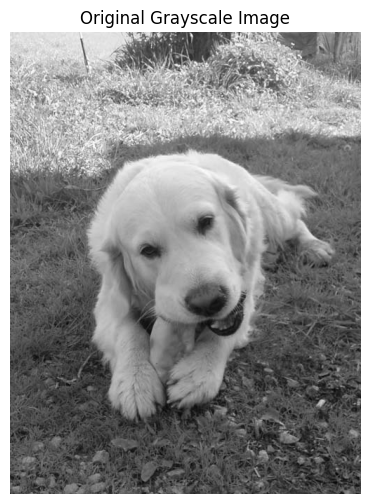

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import imageio.v2 as imageio
from skimage.color import rgb2gray

url = "https://upload.wikimedia.org/wikipedia/commons/a/af/Golden_retriever_eating_pigs_foot.jpg"  # If this image becomes unavailable (rare!) read some other from web
image = imageio.imread(url)

gray_image = rgb2gray(image)

plt.figure(figsize=(6, 6))
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')
plt.show()

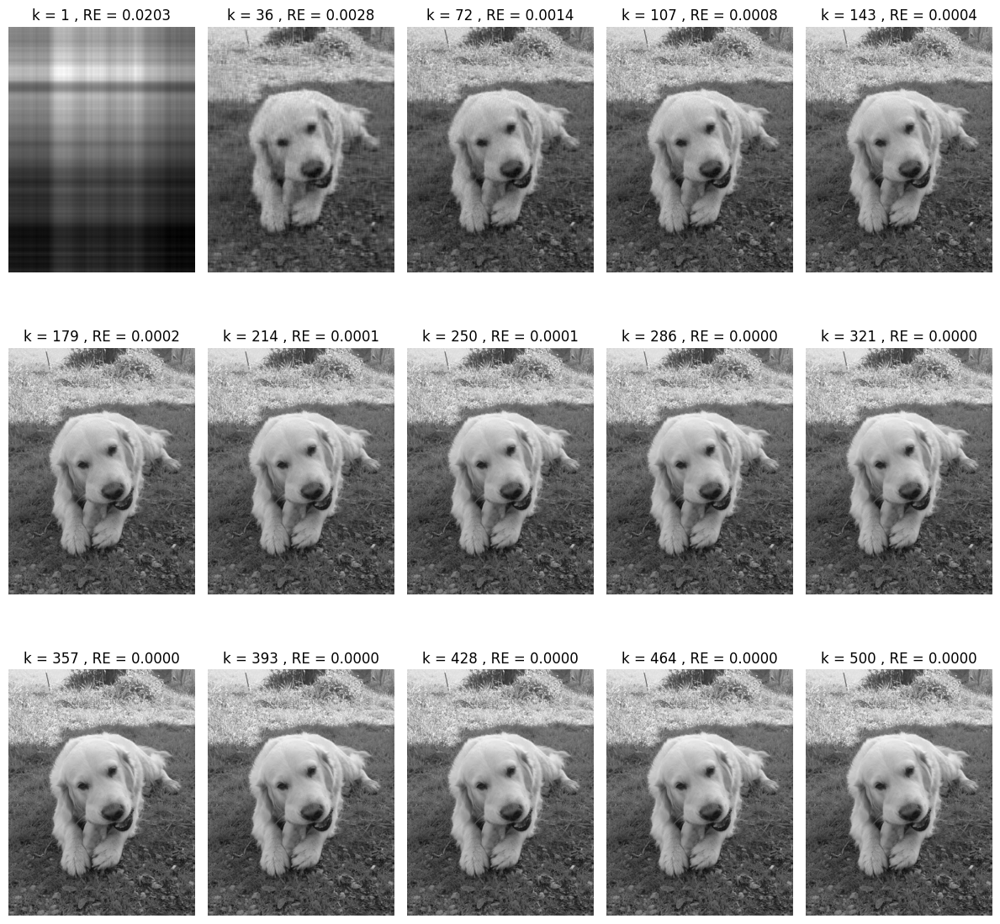

In [9]:

def compress_image_using_topk_singular_values(image, k):
    U, S, Vt = np.linalg.svd(image, full_matrices=False)
    S_k = np.diag(S[:k])
    U_k = U[:, :k]
    Vt_k = Vt[:k, :]
    compressed_image = np.dot(U_k, np.dot(S_k, Vt_k))
    return compressed_image

def reconstruction_error(original, reconstructed):
    return np.mean((original - reconstructed) ** 2)

m, n = gray_image.shape
k_values = np.linspace(1, min(m, n), 15, dtype=int)
plt.figure(figsize=(12, 12))
for i, k in enumerate(k_values):
    compressed_image = compress_image_using_topk_singular_values(gray_image, k)
    re = reconstruction_error(gray_image, compressed_image)
    plt.subplot(3, 5, i + 1)
    plt.imshow(compressed_image, cmap='gray')
    plt.title(f'k = {k} , RE = {re:.4f}')
    plt.axis('off')

plt.tight_layout()
plt.show()


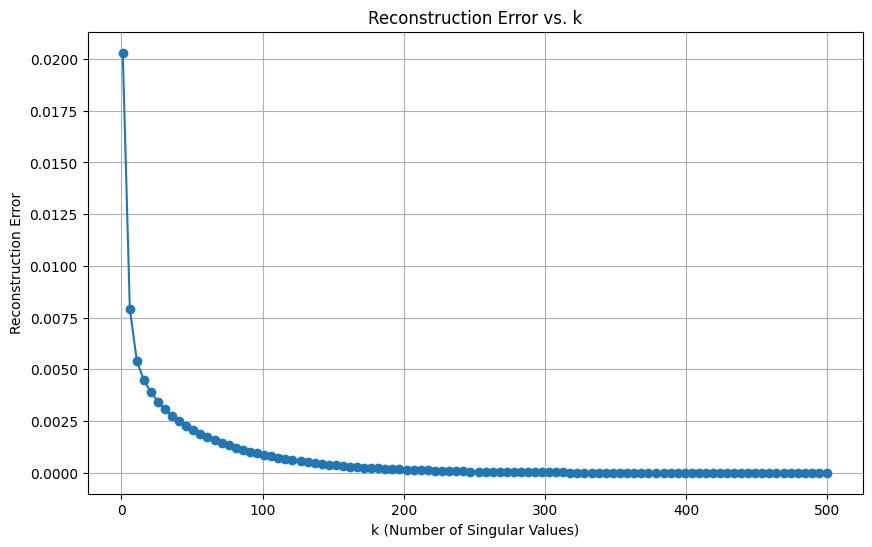

In [10]:
# Plot Reconstruction error w.r.t. 'k'
k_values = np.linspace(1, min(m, n), 100, dtype=int)  # Lets sample more 100 k values for analysing how k affects reconstruction quality.
## Your code here for plot

errors = []

for k in k_values:
    compressed_image = compress_image_using_topk_singular_values(gray_image, k)
    re = reconstruction_error(gray_image, compressed_image)
    errors.append(re)

plt.figure(figsize=(10, 6))
plt.plot(k_values, errors, marker='o')
plt.xlabel('k (Number of Singular Values)')
plt.ylabel('Reconstruction Error')
plt.title('Reconstruction Error vs. k')
plt.grid(True)
plt.show()



#### Write a brief note on
- (a) how this can be beneficial for image compression applications ?

      Ans. Singular Value Decomposition (SVD) helps in reducing the
      
      dimensionality of images by retaining only the most significant
      
      singular values and corresponding vectors. By selecting the top-k
      
      singular values, the image can be approximated with significantly
      
      less data while preserving the essential features.
      
      This method leads to efficient storage and faster transmission of images,
      
      as redundant or less significant information is discarded.
      
      The compressed images retain acceptable quality,
      
      making SVD an effective technique for image compression.
  
- (b) how k affects reconstruction quality.

      Ans.  The parameter k determines the number of singular values used to
      
      reconstruct the image. A higher k value retains more information,
      
      resulting in better image quality and lower reconstruction error.
      
      Conversely, a lower k value may lead to a loss of details and higher
      
      reconstruction error, but it also results in higher compression.
      
      Therefore, selecting an optimal k is crucial to balance between image quality and compression efficiency.

Lorem ipsum ...
